# Chapter 16 Stable Diffusion XL

## 1. What is new in SDXL

In [2]:
import torch
from diffusers import StableDiffusionXLPipeline

pipeline = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0"
    , torch_dtype = torch.float16
    , variant = "fp16"
    , use_safetensors = True
)


A matching Triton is not available, some optimizations will not be enabled.
Error caught was: No module named 'triton'
The config attributes {'add_watermarker': None} were passed to StableDiffusionXLPipeline, but are not expected and will be ignored. Please verify your model_index.json configuration file.
Keyword arguments {'add_watermarker': None} are not expected by StableDiffusionXLPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Pipelines loaded with `torch_dtype=torch.float16` cannot run with `cpu` device. It is not recommended to move them to `cpu` as running them will fail. Please make sure to use an accelerator to run the pipeline in inference, due to the lack of support for`float16` operations on this device in PyTorch. Please, remove the `torch_dtype=torch.float16` argument, or use another device for inference.
Pipelines loaded with `torch_dtype=torch.float16` cannot run with `cpu` device. It is not recommended to move them to `cpu` as running them will fail. Please make sure to use an accelerator to run the pipeline in inference, due to the lack of support for`float16` operations on this device in PyTorch. Please, remove the `torch_dtype=torch.float16` argument, or use another device for inference.
Pipelines loaded with `torch_dtype=torch.float16` cannot run with `cpu` device. It is not recommended to move them to `cpu` as running them will fail. Please make sure to use an accelerator to run the pipelin

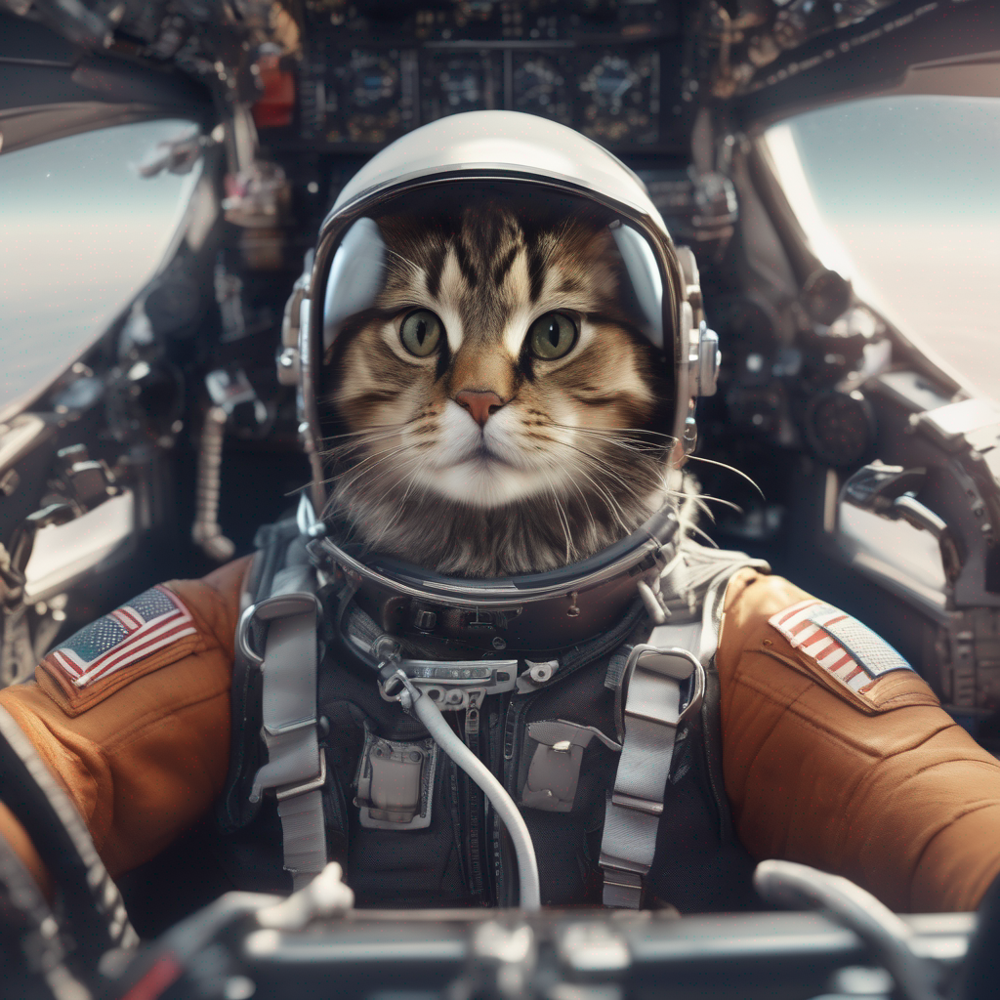

In [3]:
prompt = "realistic photo of astronaut cat in fighter cockpit, detailed, 8k"
pipeline.to("cuda")
image = pipeline(
    prompt=prompt
    , generator = torch.Generator("cuda").manual_seed(5)
).images[0]

pipeline.to("cpu")
torch.cuda.empty_cache()
image

In [ ]:
image.save("cat.png")

### 1.1. The VAE of the SDXL

In [4]:
# initialize an VAE model
import torch
from diffusers.models import AutoencoderKL
vae_model = AutoencoderKL.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0"
    , subfolder = "vae"
).to("cuda:0")

In [5]:
# Encode an image using VAE model
from diffusers.utils import load_image
from diffusers.image_processor import VaeImageProcessor
image = load_image("cat.png")

image_processor = VaeImageProcessor()
prep_image = image_processor.preprocess(image)
prep_image = prep_image.to("cuda:0")

with torch.no_grad():
    image_latent = vae_model.encode(prep_image).latent_dist.sample()

image_latent.shape

torch.Size([1, 4, 128, 128])

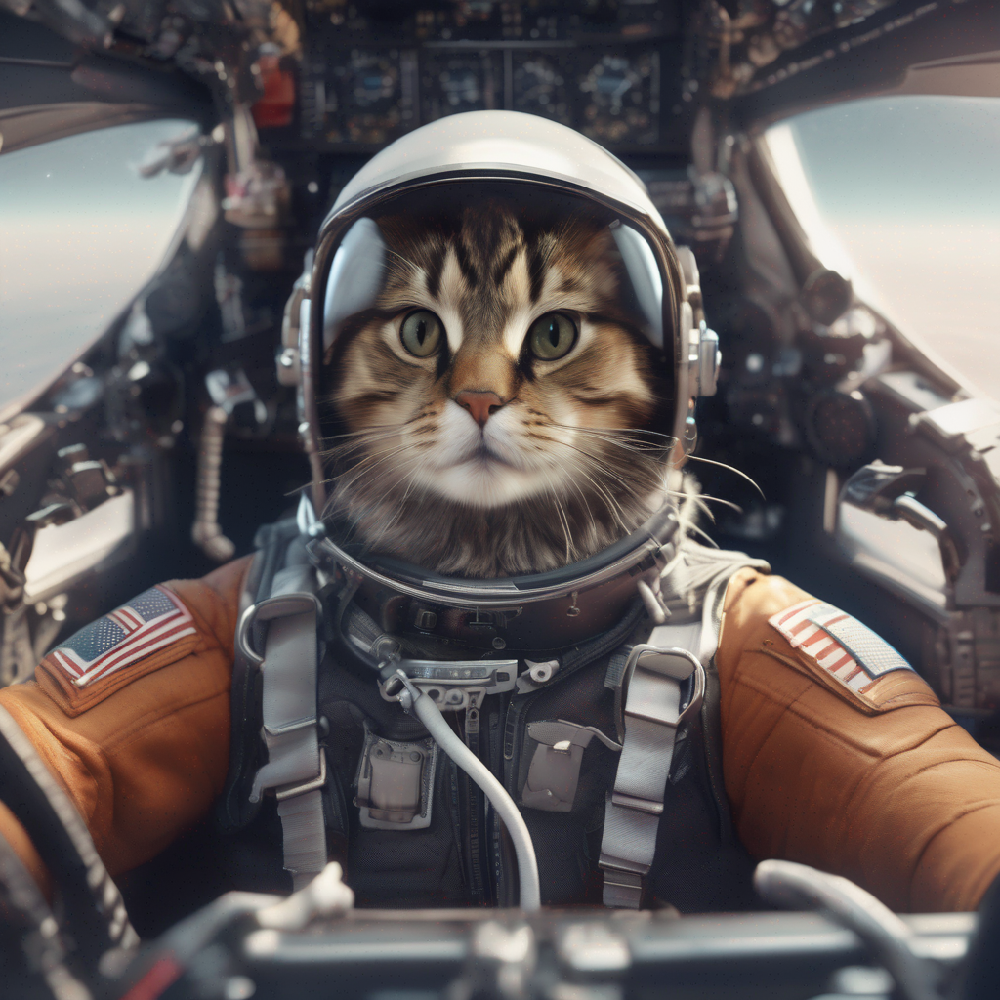

In [7]:
# Decode an image from latent space
with torch.no_grad():
    decode_image = vae_model.decode(
        image_latent
        , return_dict = False
    )[0]

image = image_processor.postprocess(image = decode_image)[0]
vae_model.to("cpu")
torch.cuda.empty_cache()
image

### 1.3. Two text encoders in SDXL

In [8]:
# text tokenizer
input_prompt = "a running dog"

from transformers import CLIPTokenizer,CLIPTextModel
import torch

# initialize tokenizer 1
clip_tokenizer = CLIPTokenizer.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0"
    , subfolder = "tokenizer"
    , dtype = torch.float16
) 

input_tokens = clip_tokenizer(
    input_prompt
    , return_tensors="pt"
)["input_ids"]
print(input_tokens)

clip_tokenizer_2 = CLIPTokenizer.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0"
    , subfolder = "tokenizer_2"
    , dtype = torch.float16
)

input_tokens_2 = clip_tokenizer_2(
    input_prompt
    , return_tensors="pt"
)["input_ids"]

print(input_tokens_2)

tensor([[49406,   320,  2761,  1929, 49407]])
tensor([[49406,   320,  2761,  1929, 49407]])


In [10]:
# use OpenAI CLIP text encoder
clip_text_encoder = CLIPTextModel.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0"
    , subfolder = "text_encoder"
    , torch_dtype =torch.float16
).to("cuda")

# encode token ids to embeddings
with torch.no_grad(): 
    prompt_embeds = clip_text_encoder(
        input_tokens.to("cuda")
    )[0]

clip_text_encoder.to("cpu")
torch.cuda.empty_cache()
print(prompt_embeds.shape)

torch.Size([1, 5, 768])


In [11]:
# use OpenCLIP text encoder
clip_text_encoder_2 = CLIPTextModel.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0"
    , subfolder = "text_encoder_2"
    , torch_dtype =torch.float16
).to("cuda")

# encode token ids to embeddings
with torch.no_grad(): 
    prompt_embeds_2 = clip_text_encoder_2(input_tokens.to("cuda"))[0]

clip_text_encoder_2.to("cpu")
torch.cuda.empty_cache()
print(prompt_embeds_2.shape)

Some weights of the model checkpoint at stabilityai/stable-diffusion-xl-base-1.0 were not used when initializing CLIPTextModel: ['text_projection.weight']
- This IS expected if you are initializing CLIPTextModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing CLIPTextModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


torch.Size([1, 5, 1280])


In [12]:
# generate Pooled embedding use OpenCLIP text encoder
from transformers import CLIPTextModelWithProjection
clip_text_encoder_2 = CLIPTextModelWithProjection.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0"
    , subfolder = "text_encoder_2"
    , torch_dtype =torch.float16
).to("cuda")

# encode token ids to embeddings
with torch.no_grad(): 
    pool_embed = clip_text_encoder_2(input_tokens.to("cuda"))[0]

clip_text_encoder_2.to("cpu")
torch.cuda.empty_cache()
print(pool_embed.shape)

torch.Size([1, 1280])


## 2. Use Stable Diffusion XL

### 2.1. Use SDXL community models 

In [1]:
import torch
from diffusers import StableDiffusionXLPipeline
sdxl_pipe = StableDiffusionXLPipeline.from_pretrained(
    "RunDiffusion/RunDiffusion-XL-Beta"
    , torch_dtype = torch.float16
    , variant = "fp16"
)
sdxl_pipe.watermark = None

A matching Triton is not available, some optimizations will not be enabled.
Error caught was: No module named 'triton'


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Pipelines loaded with `torch_dtype=torch.float16` cannot run with `cpu` device. It is not recommended to move them to `cpu` as running them will fail. Please make sure to use an accelerator to run the pipeline in inference, due to the lack of support for`float16` operations on this device in PyTorch. Please, remove the `torch_dtype=torch.float16` argument, or use another device for inference.
Pipelines loaded with `torch_dtype=torch.float16` cannot run with `cpu` device. It is not recommended to move them to `cpu` as running them will fail. Please make sure to use an accelerator to run the pipeline in inference, due to the lack of support for`float16` operations on this device in PyTorch. Please, remove the `torch_dtype=torch.float16` argument, or use another device for inference.
Pipelines loaded with `torch_dtype=torch.float16` cannot run with `cpu` device. It is not recommended to move them to `cpu` as running them will fail. Please make sure to use an accelerator to run the pipelin

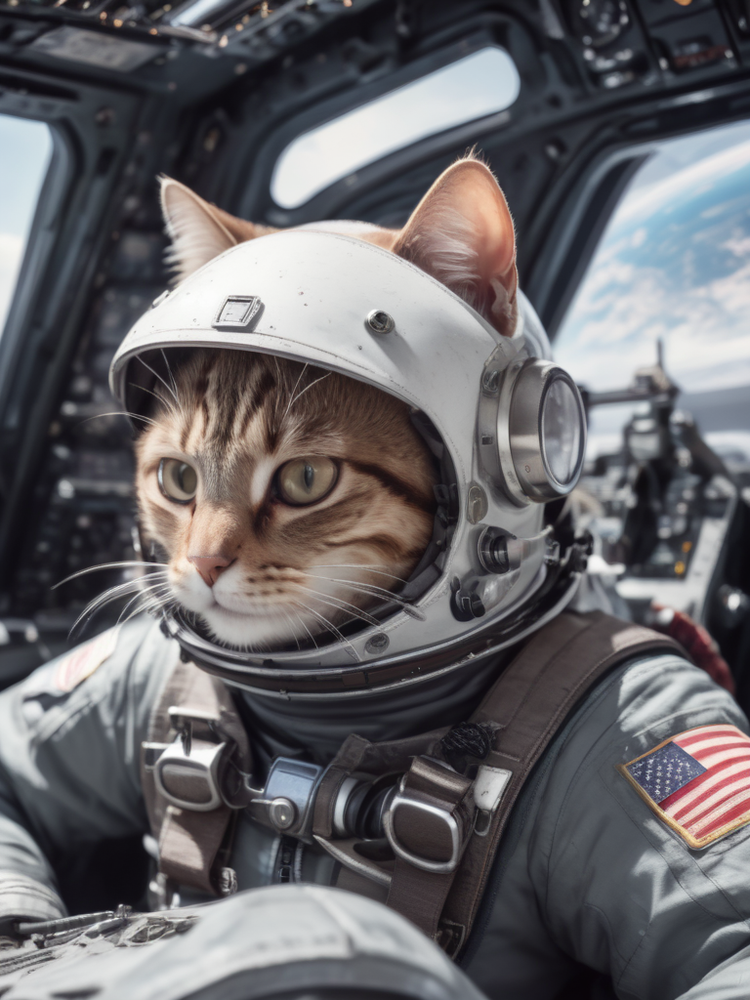

In [2]:
prompt = "realistic photo of astronaut cat in fighter cockpit, detailed, 8k"

sdxl_pipe.to("cuda")
image = sdxl_pipe(
    prompt                  = prompt
    , width                 = 768
    , height                = 1024       
    , generator             = torch.Generator("cuda").manual_seed(1)
).images[0]

sdxl_pipe.to("cpu")
torch.cuda.empty_cache()
image

### 2.2. Use SDXL Image2Image to enhance image

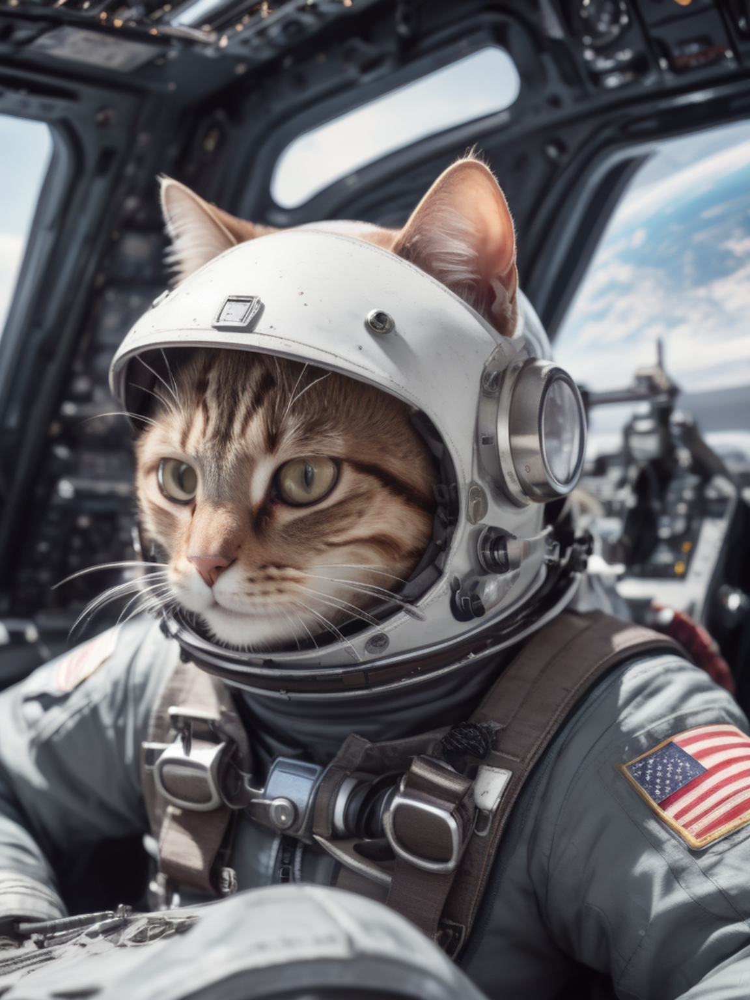

In [3]:
# upscale the image
from diffusers.image_processor import VaeImageProcessor
img_processor = VaeImageProcessor()

# get the size of the image
(width, height) = image.size
image_x = img_processor.resize(
    image = image
    , width = int(width * 1.5)
    , height = int(height * 1.5)
)
image_x

In [4]:
# start a image 2 image pipeline
from diffusers import StableDiffusionXLImg2ImgPipeline
img2img_pipe = StableDiffusionXLImg2ImgPipeline(
    vae                 = sdxl_pipe.vae
    , text_encoder      = sdxl_pipe.text_encoder
    , text_encoder_2    = sdxl_pipe.text_encoder_2
    , tokenizer         = sdxl_pipe.tokenizer
    , tokenizer_2       = sdxl_pipe.tokenizer_2
    , unet              = sdxl_pipe.unet
    , scheduler         = sdxl_pipe.scheduler
    , add_watermarker   = None
)
img2img_pipe.watermark = None

  0%|          | 0/9 [00:00<?, ?it/s]

Pipelines loaded with `torch_dtype=torch.float16` cannot run with `cpu` device. It is not recommended to move them to `cpu` as running them will fail. Please make sure to use an accelerator to run the pipeline in inference, due to the lack of support for`float16` operations on this device in PyTorch. Please, remove the `torch_dtype=torch.float16` argument, or use another device for inference.
Pipelines loaded with `torch_dtype=torch.float16` cannot run with `cpu` device. It is not recommended to move them to `cpu` as running them will fail. Please make sure to use an accelerator to run the pipeline in inference, due to the lack of support for`float16` operations on this device in PyTorch. Please, remove the `torch_dtype=torch.float16` argument, or use another device for inference.
Pipelines loaded with `torch_dtype=torch.float16` cannot run with `cpu` device. It is not recommended to move them to `cpu` as running them will fail. Please make sure to use an accelerator to run the pipelin

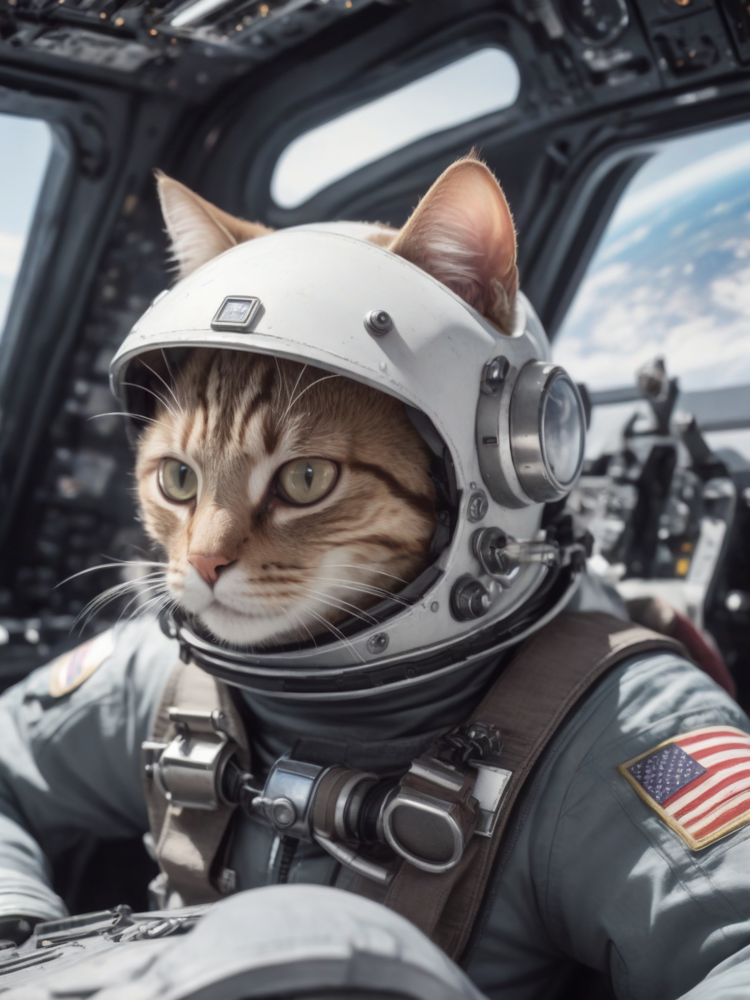

In [5]:
img2img_pipe.to("cuda")
refine_image_2x = img2img_pipe(
    image                 = image_x
    , prompt              = prompt
    , strength            = 0.3
    , num_inference_steps = 30
    , guidance_scale      = 4.0
).images[0]

img2img_pipe.to("cpu")
torch.cuda.empty_cache()
refine_image_2x

### 2.4. Use SDXL with Unlimited prompt

In [6]:
from diffusers import DiffusionPipeline
import torch

pipe = DiffusionPipeline.from_pretrained(
    "RunDiffusion/RunDiffusion-XL-Beta"
    , torch_dtype       = torch.float16
    , use_safetensors   = True
    , variant           = "fp16"
    , custom_pipeline   = "lpw_stable_diffusion_xl",
)


d:\az_git_folder\B21263_Using-Stable-Diffusion-with-Python_Content\sd_book_venv_win_p310\lib\site-packages\huggingface_hub\file_download.py:649: FutureWarning: 'cached_download' is the legacy way to download files from the HF hub, please consider upgrading to 'hf_hub_download'
  warnings.warn(


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Pipelines loaded with `torch_dtype=torch.float16` cannot run with `cpu` device. It is not recommended to move them to `cpu` as running them will fail. Please make sure to use an accelerator to run the pipeline in inference, due to the lack of support for`float16` operations on this device in PyTorch. Please, remove the `torch_dtype=torch.float16` argument, or use another device for inference.
Pipelines loaded with `torch_dtype=torch.float16` cannot run with `cpu` device. It is not recommended to move them to `cpu` as running them will fail. Please make sure to use an accelerator to run the pipeline in inference, due to the lack of support for`float16` operations on this device in PyTorch. Please, remove the `torch_dtype=torch.float16` argument, or use another device for inference.
Pipelines loaded with `torch_dtype=torch.float16` cannot run with `cpu` device. It is not recommended to move them to `cpu` as running them will fail. Please make sure to use an accelerator to run the pipelin

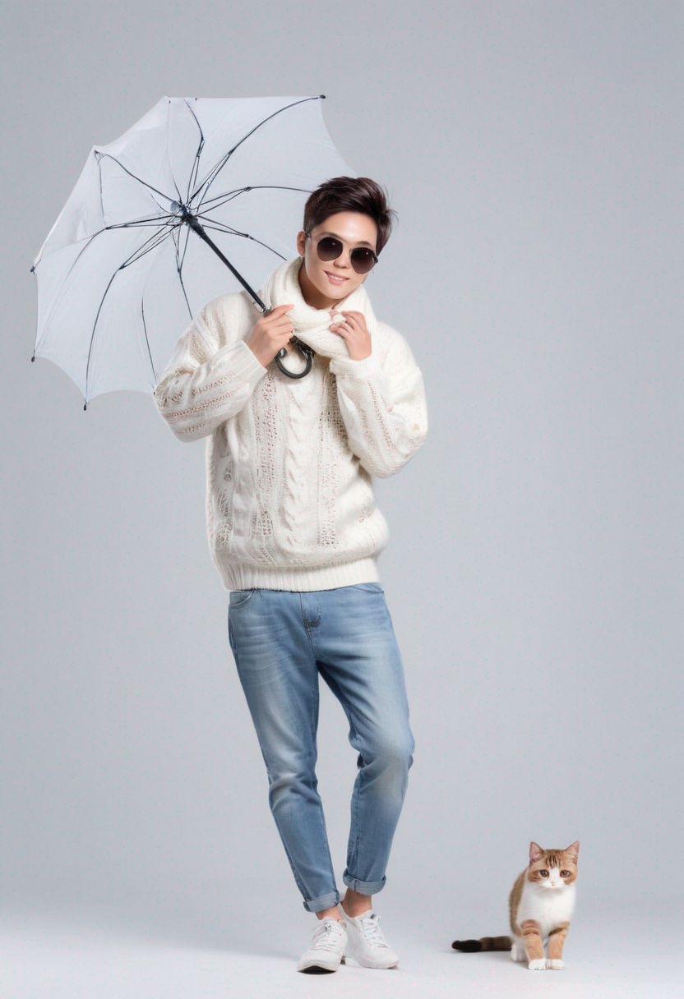

In [7]:
prompt = """
glamour photography, (full body:1.5) photo of young man,
white blank background, 
wear sweater, with scarf,
wear jean pant,
wear nike run shoes,
wear sun glass,
wear leather shoes, 
holding a umbrella in hand
""" * 2

prompt = prompt + " a (cute cat:1.5) aside"

neg_prompt = """
(worst quality:1.5),(low quality:1.5), paint, cg, spots, bad hands, 
three hands, noise, blur
"""

pipe.to("cuda")
image = pipe(
    prompt                  = prompt
    , negative_prompt       = neg_prompt
    , width                 = 832
    , height                = 1216       
    , generator             = torch.Generator("cuda").manual_seed(7)
).images[0]

pipe.to("cpu")
torch.cuda.empty_cache()
image